In [1]:
import pandas as pd
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\Wholesale customers data.csv')
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [2]:
features = [#'Channel',
 #'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicassen']
df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [3]:
df = df.rename(columns={'Delicassen':'Delicatessen'})
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region']=df['Region'].map({1: 'Lisbon', 2: 'Porto', 3: 'Other'})
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [4]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [5]:
df.to_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_processed.csv')

In [6]:
import pandas as pd

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [7]:
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_processed.csv', index_col=0)
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [8]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [9]:
df.Channel.value_counts()

HoReCa    298
Retail    142
Name: Channel, dtype: int64

In [10]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

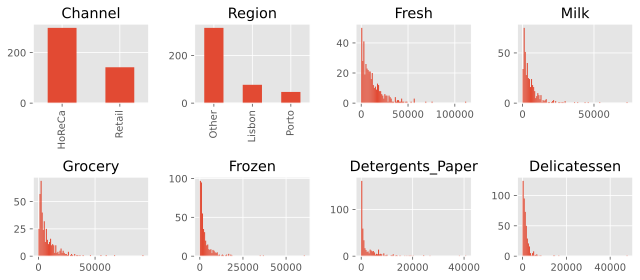

In [11]:
features = ['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']
fig, axes = plt.subplots(2,4,figsize=(9,4))
for feature, ax in zip(features, axes.ravel()):
    if(feature=='Channel') | (feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax)
    else:
        ax.hist(df[feature],bins=100)
    ax.set_title(feature)
plt.tight_layout()

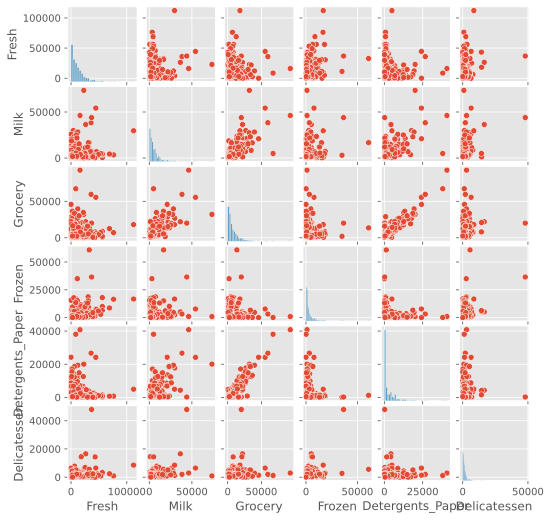

In [12]:
pplot=sns.pairplot(df, vars = features[2:])
pplot.fig.set_size_inches(7,7)

In [13]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [14]:
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_processed.csv', index_col=0)

In [15]:
features

['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicatessen']

In [16]:
data = df[features].to_numpy()
data.shape

(440, 6)

In [17]:
scaler = StandardScaler()
data = scaler.fit_transform(data)
data[:, 0].std()

1.0

In [18]:
data

array([[ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
        -0.06633906],
       [-0.39130197,  0.54445767,  0.17031835, -0.27013618,  0.08640684,
         0.08915105],
       [-0.44702926,  0.40853771, -0.0281571 , -0.13753572,  0.13323164,
         2.24329255],
       ...,
       [ 0.20032554,  1.31467078,  2.34838631, -0.54337975,  2.51121768,
         0.12145607],
       [-0.13538389, -0.51753572, -0.60251388, -0.41944059, -0.56977032,
         0.21304614],
       [-0.72930698, -0.5559243 , -0.57322717, -0.62009417, -0.50488752,
        -0.52286938]])

In [19]:
np.save(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\training_data.npy', data)

In [20]:
pca = PCA(n_components=2)
res_pca = pca.fit_transform(data)

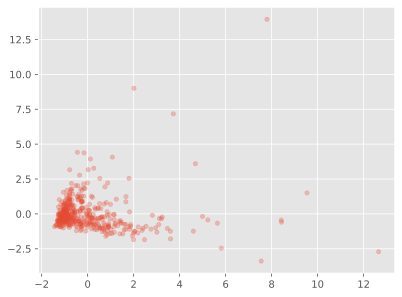

In [21]:
plt.scatter(res_pca[:,0],res_pca[:,1],s=20,alpha=0.3)

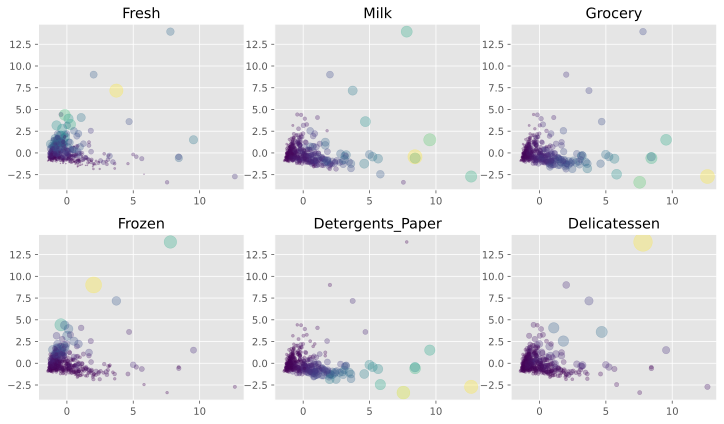

In [22]:
fig, axes = plt.subplots(2, 3, figsize=(10, 6))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_pca[:, 0], res_pca[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

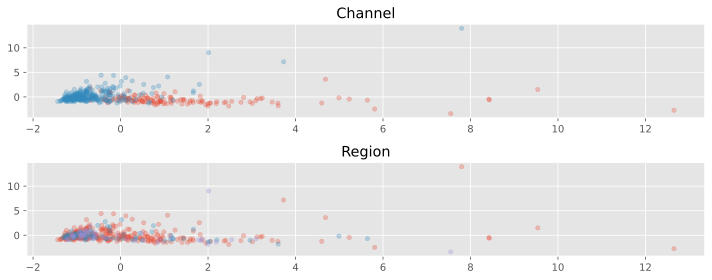

In [23]:
fig, axes = plt.subplots(2, 1, figsize=(10, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_pca[df[feature]==unique_val, 0], res_pca[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [24]:
import numpy as np
import pandas as pd

from sklearn.decomposition import KernelPCA

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [25]:
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_processed.csv', index_col=0)
data = np.load(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\training_data.npy')

In [26]:
kpca = KernelPCA(n_components=2, kernel='poly', degree=3)
res_kpca_poly = kpca.fit_transform(data)

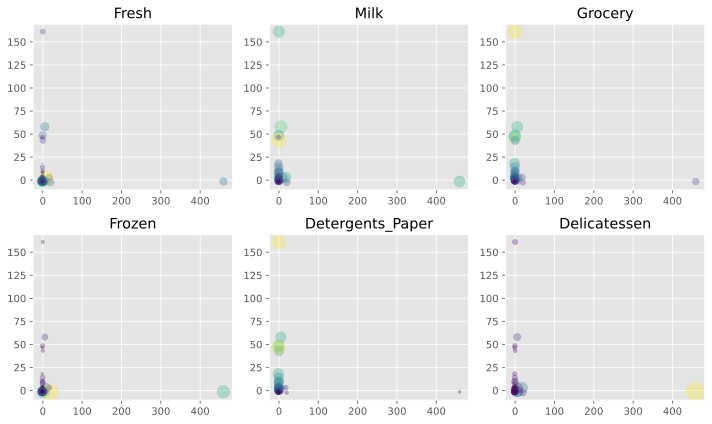

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(10, 6))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_poly[:, 0], res_kpca_poly[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

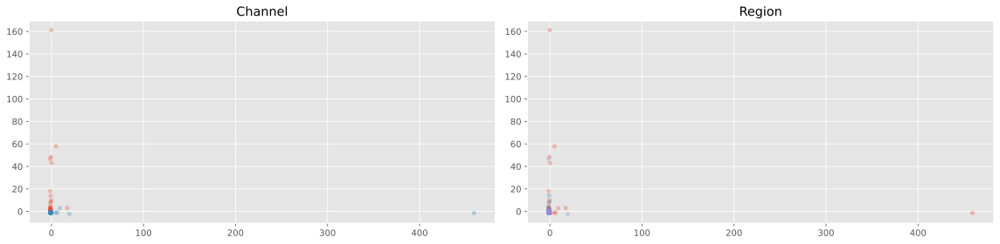

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_poly[df[feature]==unique_val, 0], res_kpca_poly[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

# Radial Basis Function

In [29]:
kpca = KernelPCA(n_components=2, kernel='rbf')
res_kpca_rbf = kpca.fit_transform(data)

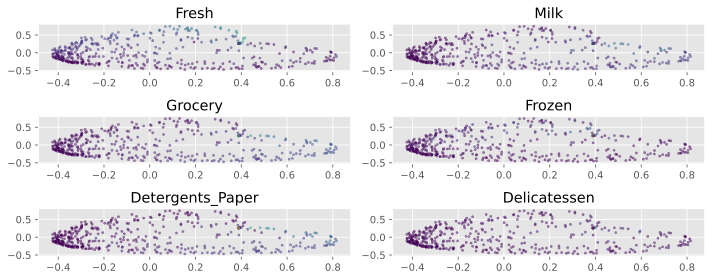

In [30]:
fig, axes = plt.subplots(3, 2, figsize=(10, 4))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 15+15*data[:, features.index(feature)]
    ax.scatter(res_kpca_rbf[:, 0], res_kpca_rbf[:, 1], s=5, alpha=0.5, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

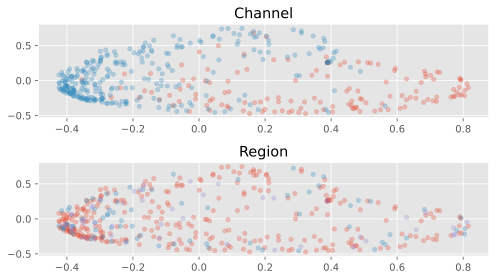

In [31]:
fig, axes = plt.subplots(2, 1, figsize=(7, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0], res_kpca_rbf[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [32]:
import numpy as np
import pandas as pd

from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [33]:
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_with_latent.csv', index_col=0)
data = np.load(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\training_data.npy')

In [34]:
res_kpca = df[['x_kpca_rbf', 'y_kpca_rbf']].to_numpy()

In [35]:
clusterer = KMeans(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

C:\Users\jai\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [36]:
markers = list('*hH+xXDd|.,ov^<>12348spP')

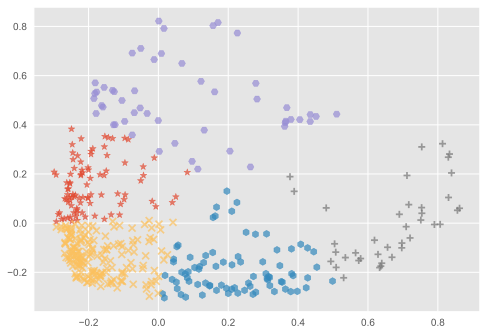

In [37]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

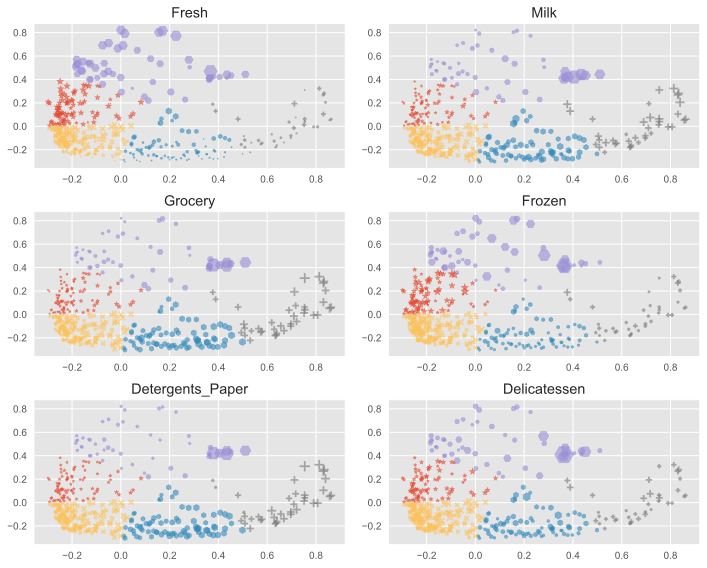

In [38]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+20*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.6, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

# Elbow Method

C:\Users\jai\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\jai\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\jai\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\jai\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with M

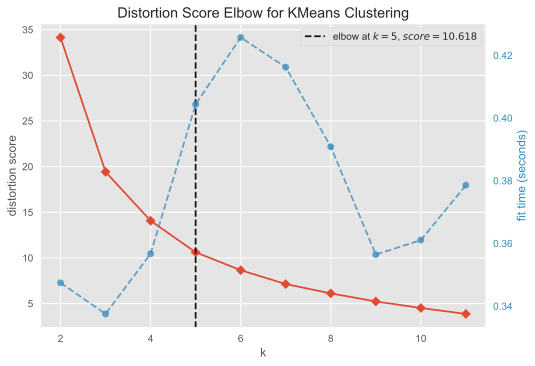

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [39]:
clusterer = KMeans()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='distortion')

visualizer.fit(res_kpca)        
visualizer.show()

In [40]:
import numpy as np
import pandas as pd

import plotly.graph_objects as go


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [41]:
df = pd.read_csv(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\data_with_clusters.csv', index_col=0)
data = np.load(r'C:\Users\jai\Desktop\Interactive Machine Learning Dashboards using Principal Component Analysis in Python\training_data.npy')

In [42]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_rbf,y_kpca_rbf,x_kpca_poly,y_kpca_poly,x_kpca_cos,y_kpca_cos,cluster_kpca_rbf
0,Retail,Other,12669,9656,7561,214,2674,1338,0.052874,-0.095702,0.078374,-0.173115,0.504789,0.009622,1
1,Retail,Other,7057,9810,9568,1762,3293,1776,0.129646,-0.160458,0.185813,-0.307415,0.889941,-0.262833,1
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.210205,0.048446,0.341702,0.075048,0.473994,0.235687,1
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.216243,0.105165,-0.253304,0.250352,-0.618611,0.370131,4
4,Retail,Other,22615,5410,7198,3915,1777,5185,-0.011687,0.265432,0.136617,0.375279,0.068900,0.861829,4


# Cluster Distribution

In [43]:
df.groupby(['cluster_kpca_rbf','Channel','Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_rbf Channel Region                                             
0                HoReCa  Lisbon   7186.735294   2224.764706   2648.911765   
                         Other    6617.739496   2387.983193   2657.747899   
                         Porto    7411.941176   1716.823529   4019.000000   
                 Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                         Other   13953.500000   4443.333333   6634.750000   
                         Porto   10708.666667   3779.666667   6193.333333   
1                HoReCa  Lisbon   4422.571429   9945.428571   8472.428571   
                         Other    3067.066667   6702.533333   9402.733333   
                 Retail  Lisbon   3341.571429   7110.714286  13179.571429   
                         Other    5984.403846   7408.000000  11534.000000   
                         Porto    2993.500000   8762.333333  11137.333333   
2                HoReCa  Lisbon   5909.000000  23527.000000  13699.000000   
                         Other   10683.000000  21858.000000  15400.000000   
                 Retail  Lisbon   4445.625000  16237.500000  27518.250000   
                         Other    6041.962963  14973.074074  24011.000000   
                         Porto    5135.571429  13998.142857  20566.428571   
3                HoReCa  Lisbon  42521.600000   6157.000000   5525.200000   
                         Other   41578.625000   7118.583333   7202.416667   
                         Porto   32717.000000  16784.000000  13626.000000   
                 Retail  Other   31176.000000  30966.777778  33162.444444   
                         Porto    8565.000000   4980.000000  67298.000000   
4                HoReCa  Lisbon  22284.083333   2397.500000   3903.916667   
                         Other   20888.115385   3045.019231   3356.346154   
                         Porto   16749.500000   1854.900000   4112.500000   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   21992.000000   6299.200000   9801.200000   
                         Porto   21952.500000   3872.500000   6766.500000   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_rbf Channel Region                                                
0                HoReCa  Lisbon   2511.382353        805.352941    644.676471  
                         Other    1759.924370        518.823529    932.697479  
                         Porto    2383.705882        446.941176    852.647059  
                 Retail  Lisbon   5612.000000        788.000000   1360.000000  
                         Other    1018.166667       2582.333333   1085.916667  
                         Porto     898.666667       2860.666667    930.000000  
1                HoReCa  Lisbon   1518.714286       2900.714286   1515.285714  
                         Other    1576.866667       3366.200000   1086.466667  
                 Retail  Lisbon   1090.142857       5953.000000   1928.285714  
                         Other    1271.326923       5021.230769   1399.461538  
                         Porto     692.166667       5765.833333   1018.500000  
2                HoReCa  Lisbon  10155.000000        830.000000   3636.000000  
                         Other    3635.000000        282.000000   5120.000000  
                 Retail  Lisbon   2898.875000      12759.125000   1893.375000  
                         Other    1456.185185      10830.888889   1929.259259  
                         Porto    1338.142857      10581.857143   1114.285714  
3                HoReCa  Lisbon   7690.600000        714.400000   3224.400000  
                         Other   10997.833333       1064.083333   5250.750000  
                         Porto   60869.000000       1272.000000   5609.000000  
                 Retail  Other    2589.000000      14175.444444   4563.777778  
                         Porto     131.000000 

In [44]:
df.groupby('cluster_kpca_rbf').count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_rbf,y_kpca_rbf,x_kpca_poly,y_kpca_poly,x_kpca_cos,y_kpca_cos
cluster_kpca_rbf,,,,,,,,,,,,,,
0,186,186,186,186,186,186,186,186,186,186,186,186,186,186
1,87,87,87,87,87,87,87,87,87,87,87,87,87,87
2,44,44,44,44,44,44,44,44,44,44,44,44,44,44
3,40,40,40,40,40,40,40,40,40,40,40,40,40,40
4,83,83,83,83,83,83,83,83,83,83,83,83,83,83


In [45]:
clusters = df.cluster_kpca_rbf.tolist()

In [46]:
df_normalized = df.copy(deep=True)
df_normalized.loc[:, features] = data

In [47]:
df_normalized.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_rbf,y_kpca_rbf,x_kpca_poly,y_kpca_poly,x_kpca_cos,y_kpca_cos,cluster_kpca_rbf
0,Retail,Other,0.052933,0.523568,-0.041115,-0.589367,-0.043569,-0.066339,0.052874,-0.095702,0.078374,-0.173115,0.504789,0.009622,1
1,Retail,Other,-0.391302,0.544458,0.170318,-0.270136,0.086407,0.089151,0.129646,-0.160458,0.185813,-0.307415,0.889941,-0.262833,1
2,Retail,Other,-0.447029,0.408538,-0.028157,-0.137536,0.133232,2.243293,0.210205,0.048446,0.341702,0.075048,0.473994,0.235687,1
3,HoReCa,Other,0.100111,-0.624020,-0.392977,0.687144,-0.498588,0.093411,-0.216243,0.105165,-0.253304,0.250352,-0.618611,0.370131,4
4,Retail,Other,0.840239,-0.052396,-0.079356,0.173859,-0.231918,1.299347,-0.011687,0.265432,0.136617,0.375279,0.068900,0.861829,4


In [48]:
biggest_cluster = df.groupby('cluster_kpca_rbf').count().max().max()
biggest_cluster

186

In [49]:
fig = go.Figure()

for cluster in np.unique(clusters):
    
    radii = df_normalized.loc[df_normalized.cluster_kpca_rbf==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_rbf==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster_kpca_rbf==cluster])
    print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster, 0.6])
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    showlegend=True,
    template='plotly_dark',
    width=800,
    autosize=False
)

fig.show()

186
87
44
40
83


In [50]:
fig.write_html('Demo.html')